# Part 1: Import Semua Packages/Library yang Digunakan

Dataset: https://www.kaggle.com/datasets/faizalkarim/flood-area-segmentation

In [1]:
!pip install segmentation-models-pytorch albumentations kagglehub -q
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from tqdm import tqdm
import random

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

import albumentations as A
from albumentations.pytorch import ToTensorV2

import segmentation_models_pytorch as smp
from sklearn.model_selection import train_test_split

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Set random seed for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)

print("✓ All libraries imported successfully!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 6.1 MB/s eta 0:00:00
Using device: cuda
✓ All libraries imported successfully!


# Part 2: Data Preparation (Download Dataset dari Kaggle)

In [2]:
import kagglehub

print("="*60)
print("SETUP KAGGLE API & DOWNLOAD DATASET")
print("="*60)

# Setup Kaggle API credentials
os.environ['KAGGLE_USERNAME'] = "firdauskz"
os.environ['KAGGLE_KEY'] = "c84bf9823623b2710e422d428e8037f3"

print("✓ Kaggle API credentials configured")

# Download dataset menggunakan kagglehub
print("\nDownloading dataset from Kaggle...")
dataset_path = kagglehub.dataset_download("faizalkarim/flood-area-segmentation")

print(f"✓ Dataset downloaded to: {dataset_path}")

# Cek struktur folder hasil download
print("\nStruktur folder dataset:")
for root, dirs, files in os.walk(dataset_path):
    level = root.replace(dataset_path, '').count(os.sep)
    indent = ' ' * 2 * level
    print(f'{indent}{os.path.basename(root)}/')
    if level < 2:  # Hanya tampilkan 2 level
        subindent = ' ' * 2 * (level + 1)
        for file in files[:3]:  # Tampilkan 3 file pertama
            print(f'{subindent}- {file}')
        if len(files) > 3:
            print(f'{subindent}... and {len(files)-3} more files')

SETUP KAGGLE API & DOWNLOAD DATASET
✓ Kaggle API credentials configured

Using Colab cache for faster access to the 'flood-area-segmentation' dataset.
✓ Dataset downloaded to: /kaggle/input/flood-area-segmentation

Struktur folder dataset:
flood-area-segmentation/
  - metadata.csv
  Mask/
    - 1017.png
    - 2015.png
    - 1084.png
    ... and 287 more files
  Image/
    - 2008.jpg
    - 1075.jpg
    - 2029.jpg
    ... and 287 more files


In [3]:
# ============================================================
# Cari folder Image dan Mask
# ============================================================

print("="*60)
print("MENCARI FOLDER IMAGE DAN MASK")
print("="*60)

# Path ke folder images dan masks - coba beberapa kemungkinan
possible_image_dirs = [
    os.path.join(dataset_path, 'Image'),
    os.path.join(dataset_path, 'image'),
    os.path.join(dataset_path, 'images'),
    os.path.join(dataset_path, 'Images'),
]

possible_mask_dirs = [
    os.path.join(dataset_path, 'Mask'),
    os.path.join(dataset_path, 'mask'),
    os.path.join(dataset_path, 'masks'),
    os.path.join(dataset_path, 'Masks'),
]

# Cari folder Image
IMAGE_DIR = None
for path in possible_image_dirs:
    if os.path.exists(path):
        IMAGE_DIR = path
        break

# Cari folder Mask
MASK_DIR = None
for path in possible_mask_dirs:
    if os.path.exists(path):
        MASK_DIR = path
        break

# Jika tidak ditemukan, cari secara rekursif
if IMAGE_DIR is None:
    print("Mencari folder Image secara rekursif...")
    for root, dirs, files in os.walk(dataset_path):
        for d in dirs:
            if d.lower() == 'image' or d.lower() == 'images':
                IMAGE_DIR = os.path.join(root, d)
                print(f"  ✓ Ditemukan di: {IMAGE_DIR}")
                break
        if IMAGE_DIR:
            break

if MASK_DIR is None:
    print("Mencari folder Mask secara rekursif...")
    for root, dirs, files in os.walk(dataset_path):
        for d in dirs:
            if d.lower() == 'mask' or d.lower() == 'masks':
                MASK_DIR = os.path.join(root, d)
                print(f"  ✓ Ditemukan di: {MASK_DIR}")
                break
        if MASK_DIR:
            break

# Verifikasi
if IMAGE_DIR is None:
    raise FileNotFoundError("Folder Image tidak ditemukan!")
if MASK_DIR is None:
    raise FileNotFoundError("Folder Mask tidak ditemukan!")

print(f"\n✓ Image folder: {IMAGE_DIR}")
print(f"✓ Mask folder:  {MASK_DIR}")

MENCARI FOLDER IMAGE DAN MASK

✓ Image folder: /kaggle/input/flood-area-segmentation/Image
✓ Mask folder:  /kaggle/input/flood-area-segmentation/Mask


In [4]:
# ============================================================
# Load Data
# ============================================================

print("="*60)
print("LOADING DATA")
print("="*60)

# Load semua path gambar dan mask
image_paths = sorted(glob(os.path.join(IMAGE_DIR, '*.*')))
mask_paths = sorted(glob(os.path.join(MASK_DIR, '*.*')))

# Filter hanya file gambar
valid_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff']
image_paths = [p for p in image_paths if os.path.splitext(p)[1].lower() in valid_extensions]
mask_paths = [p for p in mask_paths if os.path.splitext(p)[1].lower() in valid_extensions]

print(f'\n✓ Total images: {len(image_paths)}')
print(f'✓ Total masks:  {len(mask_paths)}')

# Verifikasi
assert len(image_paths) > 0, "Tidak ada gambar ditemukan!"
assert len(mask_paths) > 0, "Tidak ada mask ditemukan!"
assert len(image_paths) == len(mask_paths), f"Jumlah tidak sama! Images: {len(image_paths)}, Masks: {len(mask_paths)}"

# Tampilkan contoh
print(f'\nContoh file:')
print(f'  Image: {os.path.basename(image_paths[0])}')
print(f'  Mask:  {os.path.basename(mask_paths[0])}')

# Cek dimensi sample
sample_img = cv2.imread(image_paths[0])
sample_mask = cv2.imread(mask_paths[0], cv2.IMREAD_GRAYSCALE)
print(f'\nDimensi sample:')
print(f'  Image: {sample_img.shape}')
print(f'  Mask:  {sample_mask.shape}')

LOADING DATA

✓ Total images: 290
✓ Total masks:  290

Contoh file:
  Image: 0.jpg
  Mask:  0.png

Dimensi sample:
  Image: (551, 893, 3)
  Mask:  (551, 893)


In [5]:
# ============================================================
# Dataset Class
# ============================================================

class SegmentationDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None, img_size=(256, 256)):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        self.img_size = img_size

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Load image dan mask
        image = cv2.imread(self.image_paths[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(self.mask_paths[idx], cv2.IMREAD_GRAYSCALE)

        # Resize image and mask to IMG_SIZE before applying transformations
        image = cv2.resize(image, self.img_size)
        mask = cv2.resize(mask, self.img_size, interpolation=cv2.INTER_NEAREST)

        # Normalisasi mask ke [0, 1]
        mask = (mask > 0).astype(np.float32)

        # Apply transformations
        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        return image, mask.unsqueeze(0)

print("✓ SegmentationDataset class defined!")

✓ SegmentationDataset class defined!


In [6]:
# ============================================================
# Split Data
# ============================================================

train_images, temp_images, train_masks, temp_masks = train_test_split(
    image_paths, mask_paths, test_size=0.3, random_state=42
)

val_images, test_images, val_masks, test_masks = train_test_split(
    temp_images, temp_masks, test_size=0.5, random_state=42
)

print("="*60)
print('DATA SPLIT')
print("="*60)
print(f'Train:      {len(train_images)} images ({len(train_images)/len(image_paths)*100:.1f}%)')
print(f'Validation: {len(val_images)} images ({len(val_images)/len(image_paths)*100:.1f}%)')
print(f'Test:       {len(test_images)} images ({len(test_images)/len(image_paths)*100:.1f}%)')

DATA SPLIT
Train:      203 images (70.0%)
Validation: 43 images (14.8%)
Test:       44 images (15.2%)


VISUALISASI SAMPLE DATA


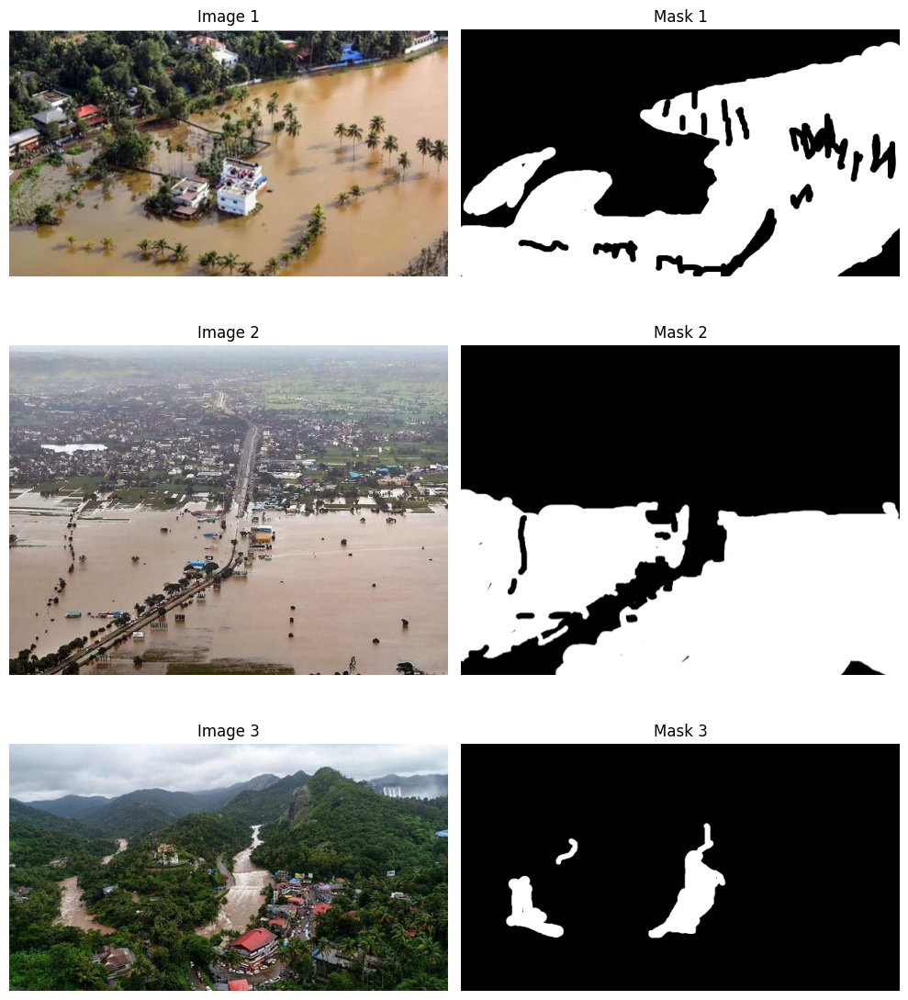


✅ Part 2 selesai! Lanjut ke Part 3


In [7]:
# ============================================================
# Visualisasi Sample
# ============================================================

def visualize_samples(image_paths, mask_paths, num_samples=3):
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 4*num_samples))

    if num_samples == 1:
        axes = axes.reshape(1, -1)

    for i in range(num_samples):
        img = cv2.imread(image_paths[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_paths[i], cv2.IMREAD_GRAYSCALE)

        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f'Image {i+1}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].set_title(f'Mask {i+1}')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

print("="*60)
print('VISUALISASI SAMPLE DATA')
print("="*60)
visualize_samples(train_images, train_masks, num_samples=3)

print("\n✅ Part 2 selesai! Lanjut ke Part 3")

# Part 3: Data Augmentation dan DataLoaders

In [8]:
# Hyperparameters
IMG_SIZE = 256  # Resize image ke 256x256
BATCH_SIZE = 8
NUM_EPOCHS = 50  # Optimal untuk 290 images - cukup untuk convergence
LEARNING_RATE = 1e-4

# Training augmentations (dengan augmentasi data)
train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.GaussNoise(p=0.3),
    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
    ToTensorV2(),
])

# Validation dan Test augmentations (hanya resize dan normalize)
val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
    ToTensorV2(),
])

# Create datasets
train_dataset = SegmentationDataset(train_images, train_masks, transform=train_transform)
val_dataset = SegmentationDataset(val_images, val_masks, transform=val_transform)
test_dataset = SegmentationDataset(test_images, test_masks, transform=val_transform)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print(f'Train batches: {len(train_loader)}')
print(f'Validation batches: {len(val_loader)}')
print(f'Test batches: {len(test_loader)}')

Train batches: 26
Validation batches: 6
Test batches: 6


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)



Contoh hasil augmentasi training data:


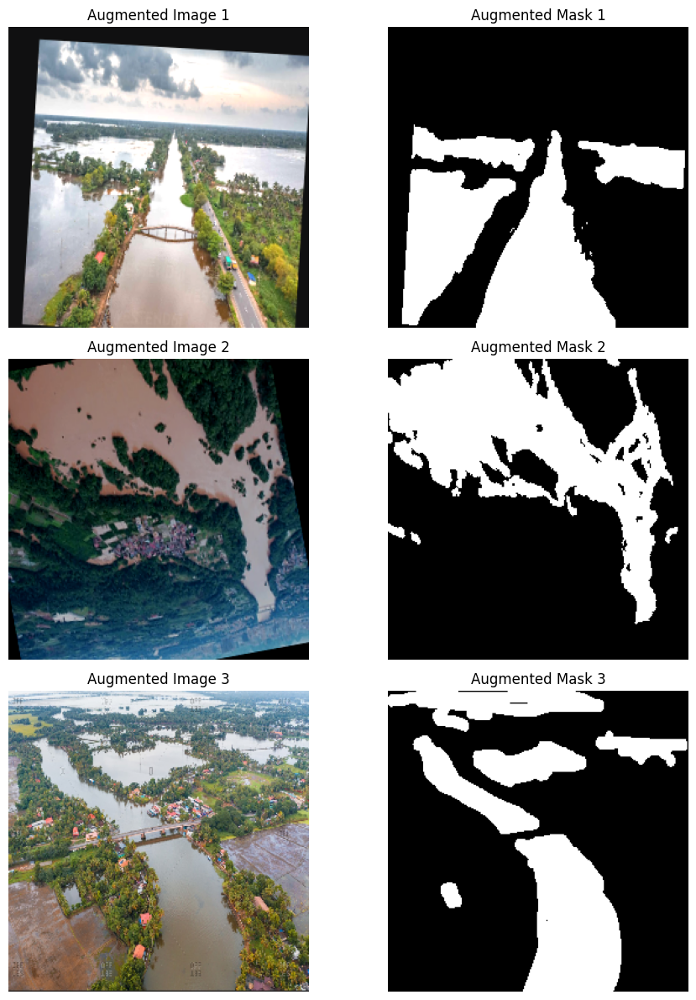

In [9]:
# Visualisasi augmentasi
def show_augmented_samples(dataset, num_samples=4):
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 4*num_samples))

    for i in range(num_samples):
        img, mask = dataset[random.randint(0, len(dataset)-1)]

        # Denormalize image untuk visualisasi
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        img_denorm = img * std + mean
        img_denorm = torch.clamp(img_denorm, 0, 1)

        axes[i, 0].imshow(img_denorm.permute(1, 2, 0))
        axes[i, 0].set_title(f'Augmented Image {i+1}')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mask.squeeze(), cmap='gray')
        axes[i, 1].set_title(f'Augmented Mask {i+1}')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

print('\nContoh hasil augmentasi training data:')
show_augmented_samples(train_dataset, num_samples=3)

# Part 4: Model Architecture (U-Net dan U-Net++)

In [10]:
# Fungsi untuk membuat model
def create_model(architecture='unet', encoder='resnet34', pretrained=True):
    """
    architecture: 'unet' atau 'unetplusplus'
    encoder: backbone encoder (resnet34, resnet50, efficientnet-b0, dll)
    pretrained: gunakan pretrained ImageNet weights
    """

    if architecture == 'unet':
        model = smp.Unet(
            encoder_name=encoder,
            encoder_weights='imagenet' if pretrained else None,
            in_channels=3,
            classes=1,  # Binary segmentation
            activation=None,  # Akan pakai sigmoid di loss function
        )
    elif architecture == 'unetplusplus':
        model = smp.UnetPlusPlus(
            encoder_name=encoder,
            encoder_weights='imagenet' if pretrained else None,
            in_channels=3,
            classes=1,
            activation=None,
        )
    else:
        raise ValueError(f"Unknown architecture: {architecture}")

    return model

# Create models
print("Creating models...")

# Model 1: U-Net Baseline (tanpa pretrained)
model_unet_baseline = create_model(
    architecture='unet',
    encoder='resnet34',
    pretrained=False
).to(device)

# Model 2: U-Net dengan pretrained encoder
model_unet_pretrained = create_model(
    architecture='unet',
    encoder='resnet34',
    pretrained=True
).to(device)

# Model 3: U-Net++ dengan pretrained encoder
model_unetplusplus = create_model(
    architecture='unetplusplus',
    encoder='resnet34',
    pretrained=True
).to(device)

print("\nModel 1: U-Net Baseline (no pretrained)")
print(f"Parameters: {sum(p.numel() for p in model_unet_baseline.parameters()):,}")

print("\nModel 2: U-Net + Pretrained Encoder")
print(f"Parameters: {sum(p.numel() for p in model_unet_pretrained.parameters()):,}")

print("\nModel 3: U-Net++")
print(f"Parameters: {sum(p.numel() for p in model_unetplusplus.parameters()):,}")

Creating models...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]


Model 1: U-Net Baseline (no pretrained)
Parameters: 24,436,369

Model 2: U-Net + Pretrained Encoder
Parameters: 24,436,369

Model 3: U-Net++
Parameters: 26,078,609


# Part 5: Loss Function dan Metrics

In [11]:
# Combined Loss: BCE + Dice Loss
class CombinedLoss(nn.Module):
    def __init__(self, bce_weight=0.5, dice_weight=0.5):
        super().__init__()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight
        self.bce = nn.BCEWithLogitsLoss()

    def dice_loss(self, pred, target, smooth=1e-6):
        pred = torch.sigmoid(pred)
        pred = pred.contiguous().view(-1)
        target = target.contiguous().view(-1)

        intersection = (pred * target).sum()
        dice = (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

        return 1 - dice

    def forward(self, pred, target):
        bce = self.bce(pred, target)
        dice = self.dice_loss(pred, target)
        return self.bce_weight * bce + self.dice_weight * dice

# Metric functions
def calculate_iou(pred, target, threshold=0.5, smooth=1e-6):
    """Intersection over Union (IoU)"""
    pred = (pred > threshold).float()
    target = target.float()

    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection

    iou = (intersection + smooth) / (union + smooth)
    return iou.item()

def calculate_dice(pred, target, threshold=0.5, smooth=1e-6):
    """Dice Coefficient"""
    pred = (pred > threshold).float()
    target = target.float()

    intersection = (pred * target).sum()
    dice = (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

    return dice.item()

def calculate_pixel_accuracy(pred, target, threshold=0.5):
    """Pixel Accuracy"""
    pred = (pred > threshold).float()
    target = target.float()

    correct = (pred == target).float().sum()
    total = target.numel()

    return (correct / total).item()

def calculate_metrics(pred, target, threshold=0.5):
    """Calculate all metrics"""
    pred_sigmoid = torch.sigmoid(pred)

    iou = calculate_iou(pred_sigmoid, target, threshold)
    dice = calculate_dice(pred_sigmoid, target, threshold)
    pixel_acc = calculate_pixel_accuracy(pred_sigmoid, target, threshold)

    return {
        'iou': iou,
        'dice': dice,
        'pixel_accuracy': pixel_acc
    }

# Test metrics
print("Testing metrics with dummy data...")
dummy_pred = torch.randn(2, 1, 256, 256)
dummy_target = torch.randint(0, 2, (2, 1, 256, 256)).float()

metrics = calculate_metrics(dummy_pred, dummy_target)
print(f"IoU: {metrics['iou']:.4f}")
print(f"Dice: {metrics['dice']:.4f}")
print(f"Pixel Accuracy: {metrics['pixel_accuracy']:.4f}")
print("\n✓ Metrics working correctly!")

Testing metrics with dummy data...
IoU: 0.3333
Dice: 0.4999
Pixel Accuracy: 0.4999

✓ Metrics working correctly!


# Part 6: Training dan Validation Functions

In [12]:
def train_epoch(model, loader, criterion, optimizer, device):
    model.train()
    total_loss = 0
    total_iou = 0
    total_dice = 0
    total_pixel_acc = 0

    pbar = tqdm(loader, desc='Training')
    for images, masks in pbar:
        images = images.to(device)
        masks = masks.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, masks)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Calculate metrics
        with torch.no_grad():
            metrics = calculate_metrics(outputs, masks)

        total_loss += loss.item()
        total_iou += metrics['iou']
        total_dice += metrics['dice']
        total_pixel_acc += metrics['pixel_accuracy']

        pbar.set_postfix({
            'loss': f"{loss.item():.4f}",
            'iou': f"{metrics['iou']:.4f}"
        })

    num_batches = len(loader)
    return {
        'loss': total_loss / num_batches,
        'iou': total_iou / num_batches,
        'dice': total_dice / num_batches,
        'pixel_accuracy': total_pixel_acc / num_batches
    }

def validate_epoch(model, loader, criterion, device):
    model.eval()
    total_loss = 0
    total_iou = 0
    total_dice = 0
    total_pixel_acc = 0

    with torch.no_grad():
        pbar = tqdm(loader, desc='Validation')
        for images, masks in pbar:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            metrics = calculate_metrics(outputs, masks)

            total_loss += loss.item()
            total_iou += metrics['iou']
            total_dice += metrics['dice']
            total_pixel_acc += metrics['pixel_accuracy']

            pbar.set_postfix({
                'loss': f"{loss.item():.4f}",
                'iou': f"{metrics['iou']:.4f}"
            })

    num_batches = len(loader)
    return {
        'loss': total_loss / num_batches,
        'iou': total_iou / num_batches,
        'dice': total_dice / num_batches,
        'pixel_accuracy': total_pixel_acc / num_batches
    }

def train_model(model, train_loader, val_loader, criterion, optimizer,
                num_epochs, device, model_name='model', patience=5, min_delta=0.001):
    """Full training loop with early stopping"""
    history = {
        'train_loss': [], 'train_iou': [], 'train_dice': [], 'train_pixel_acc': [],
        'val_loss': [], 'val_iou': [], 'val_dice': [], 'val_pixel_acc': []
    }

    best_val_iou = 0
    best_val_loss = float('inf') # Initialize with a very large loss
    patience_counter = 0
    best_model_path = f'{model_name}_best.pth'

    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch+1}/{num_epochs}')
        print('-' * 50)

        # Training
        train_metrics = train_epoch(model, train_loader, criterion, optimizer, device)

        # Validation
        val_metrics = validate_epoch(model, val_loader, criterion, device)

        # Save history
        history['train_loss'].append(train_metrics['loss'])
        history['train_iou'].append(train_metrics['iou'])
        history['train_dice'].append(train_metrics['dice'])
        history['train_pixel_acc'].append(train_metrics['pixel_accuracy'])

        history['val_loss'].append(val_metrics['loss'])
        history['val_iou'].append(val_metrics['iou'])
        history['val_dice'].append(val_metrics['dice'])
        history['val_pixel_acc'].append(val_metrics['pixel_accuracy'])

        # Print metrics
        print(f"\nTrain - Loss: {train_metrics['loss']:.4f}, IoU: {train_metrics['iou']:.4f}, "
              f"Dice: {train_metrics['dice']:.4f}, Pixel Acc: {train_metrics['pixel_accuracy']:.4f}")
        print(f"Val   - Loss: {val_metrics['loss']:.4f}, IoU: {val_metrics['iou']:.4f}, "
              f"Dice: {val_metrics['dice']:.4f}, Pixel Acc: {val_metrics['pixel_accuracy']:.4f}")

        # Early Stopping & Save best model (based on validation loss improvement)
        if val_metrics['loss'] < best_val_loss - min_delta:
            best_val_loss = val_metrics['loss']
            torch.save(model.state_dict(), best_model_path)
            print(f"✓ Saved best model with Val Loss: {best_val_loss:.4f}")
            patience_counter = 0 # Reset patience since loss improved
        else:
            patience_counter += 1 # Increment patience since loss did not improve significantly
            print(f"Patience: {patience_counter}/{patience}")

        if patience_counter >= patience:
            print(f"\nEarly stopping triggered after {epoch+1} epochs due to no improvement in validation loss for {patience} consecutive epochs.")
            break # Stop training

    return history, best_model_path

print("✓ Training functions ready!")


✓ Training functions ready!


# Part 7: Training Models

In [13]:
import time

# Create loss
criterion = CombinedLoss(bce_weight=0.5, dice_weight=0.5)

# Dictionary untuk menyimpan hasil semua model
results = {}

# IMPORTANT: Pastikan epochs sudah diset di Part 3
# Jika belum, override di sini
TRAINING_EPOCHS = 25  # Override untuk training yang efisien

print("\n" + "="*70)
print("TRAINING CONFIGURATION")
print("="*70)
print(f"Number of models: 2")
print(f"Epochs per model: {TRAINING_EPOCHS}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Learning rate: {LEARNING_RATE}")
print(f"Training images: {len(train_images)}")
print(f"Validation images: {len(val_images)}")
print(f"Estimated total time: ~2-2.5 hours")
print("="*70)

start_time_all = time.time()

# ===== 1. Train U-Net Baseline (dengan Pretrained Encoder) =====
print("\n" + "="*70)
print("MODEL 1/2: U-Net Baseline (Pretrained ResNet34 Encoder)")
print("="*70)
print("Expected time: ~40-50 minutes")
print("="*70)

start_time = time.time()

optimizer_unet = optim.Adam(model_unet_pretrained.parameters(), lr=LEARNING_RATE)

history_unet, best_path_unet = train_model(
    model=model_unet_pretrained,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer_unet,
    num_epochs=TRAINING_EPOCHS,
    device=device,
    model_name='unet_baseline'
)

elapsed = time.time() - start_time
print(f"\n✓ U-Net training completed in {elapsed/60:.1f} minutes")

results['U-Net Baseline'] = {
    'history': history_unet,
    'best_path': best_path_unet,
    'model': model_unet_pretrained,
    'training_time': elapsed
}

# ===== 2. Train U-Net++ (Model Lanjutan) =====
print("\n" + "="*70)
print("MODEL 2/2: U-Net++ (Advanced Architecture)")
print("="*70)
print("Expected time: ~60-75 minutes")
print("Note: U-Net++ is slower due to nested skip connections")
print("="*70)

start_time = time.time()

optimizer_unetpp = optim.Adam(model_unetplusplus.parameters(), lr=LEARNING_RATE)

history_unetpp, best_path_unetpp = train_model(
    model=model_unetplusplus,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion,
    optimizer=optimizer_unetpp,
    num_epochs=TRAINING_EPOCHS,
    device=device,
    model_name='unetplusplus'
)

elapsed = time.time() - start_time
print(f"\n✓ U-Net++ training completed in {elapsed/60:.1f} minutes")

results['U-Net++'] = {
    'history': history_unetpp,
    'best_path': best_path_unetpp,
    'model': model_unetplusplus,
    'training_time': elapsed
}

# ===== Summary =====
total_time = time.time() - start_time_all

print("\n" + "="*70)
print("🎉 ALL MODELS TRAINED SUCCESSFULLY!")
print("="*70)
print(f"\nTraining Summary:")
print(f"  Total time: {total_time/3600:.2f} hours ({total_time/60:.1f} minutes)")
print(f"\n  Model 1 - U-Net Baseline:")
print(f"    Time: {results['U-Net Baseline']['training_time']/60:.1f} min")
print(f"    Best Val IoU: {max(results['U-Net Baseline']['history']['val_iou']):.4f}")
print(f"\n  Model 2 - U-Net++:")
print(f"    Time: {results['U-Net++']['training_time']/60:.1f} min")
print(f"    Best Val IoU: {max(results['U-Net++']['history']['val_iou']):.4f}")

print(f"\n✓ Best models saved:")
print(f"  - {results['U-Net Baseline']['best_path']}")
print(f"  - {results['U-Net++']['best_path']}")

print("\n" + "="*70)
print("Ready for evaluation! Proceed to Part 8")
print("="*70)



TRAINING CONFIGURATION
Number of models: 2
Epochs per model: 25
Batch size: 8
Learning rate: 0.0001
Training images: 203
Validation images: 43
Estimated total time: ~2-2.5 hours

MODEL 1/2: U-Net Baseline (Pretrained ResNet34 Encoder)
Expected time: ~40-50 minutes

Epoch 1/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  6.96it/s, loss=0.4507, iou=0.6036]



Train - Loss: 0.5591, IoU: 0.4064, Dice: 0.5702, Pixel Acc: 0.6816
Val   - Loss: 0.4379, IoU: 0.6060, Dice: 0.7523, Pixel Acc: 0.8087
✓ Saved best model with Val Loss: 0.4379

Epoch 2/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.25it/s, loss=0.3222, iou=0.7665]



Train - Loss: 0.4416, IoU: 0.5850, Dice: 0.7337, Pixel Acc: 0.7917
Val   - Loss: 0.3321, IoU: 0.7091, Dice: 0.8283, Pixel Acc: 0.8660
✓ Saved best model with Val Loss: 0.3321

Epoch 3/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.76it/s, loss=0.2808, iou=0.7719]



Train - Loss: 0.3785, IoU: 0.6429, Dice: 0.7811, Pixel Acc: 0.8309
Val   - Loss: 0.3006, IoU: 0.7193, Dice: 0.8354, Pixel Acc: 0.8701
✓ Saved best model with Val Loss: 0.3006

Epoch 4/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  6.60it/s, loss=0.2878, iou=0.7425]



Train - Loss: 0.3368, IoU: 0.6765, Dice: 0.8059, Pixel Acc: 0.8522
Val   - Loss: 0.2934, IoU: 0.7192, Dice: 0.8354, Pixel Acc: 0.8738
✓ Saved best model with Val Loss: 0.2934

Epoch 5/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.62it/s, loss=0.2569, iou=0.7846]



Train - Loss: 0.3142, IoU: 0.6908, Dice: 0.8160, Pixel Acc: 0.8584
Val   - Loss: 0.2734, IoU: 0.7367, Dice: 0.8474, Pixel Acc: 0.8811
✓ Saved best model with Val Loss: 0.2734

Epoch 6/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:02<00:00,  2.98it/s, loss=0.2515, iou=0.7739]



Train - Loss: 0.3166, IoU: 0.6799, Dice: 0.8076, Pixel Acc: 0.8544
Val   - Loss: 0.2565, IoU: 0.7497, Dice: 0.8563, Pixel Acc: 0.8838
✓ Saved best model with Val Loss: 0.2565

Epoch 7/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.61it/s, loss=0.2441, iou=0.7935]



Train - Loss: 0.2828, IoU: 0.7174, Dice: 0.8339, Pixel Acc: 0.8728
Val   - Loss: 0.2504, IoU: 0.7556, Dice: 0.8604, Pixel Acc: 0.8904
✓ Saved best model with Val Loss: 0.2504

Epoch 8/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.46it/s, loss=0.2262, iou=0.8052]



Train - Loss: 0.2758, IoU: 0.7203, Dice: 0.8353, Pixel Acc: 0.8758
Val   - Loss: 0.2304, IoU: 0.7733, Dice: 0.8715, Pixel Acc: 0.8972
✓ Saved best model with Val Loss: 0.2304

Epoch 9/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.65it/s, loss=0.2550, iou=0.7618]



Train - Loss: 0.2781, IoU: 0.7185, Dice: 0.8335, Pixel Acc: 0.8721
Val   - Loss: 0.2479, IoU: 0.7492, Dice: 0.8560, Pixel Acc: 0.8863
Patience: 1/5

Epoch 10/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.08it/s, loss=0.2087, iou=0.8108]



Train - Loss: 0.2707, IoU: 0.7214, Dice: 0.8368, Pixel Acc: 0.8743
Val   - Loss: 0.2285, IoU: 0.7671, Dice: 0.8673, Pixel Acc: 0.8890
✓ Saved best model with Val Loss: 0.2285

Epoch 11/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.66it/s, loss=0.2329, iou=0.7786]



Train - Loss: 0.2692, IoU: 0.7208, Dice: 0.8367, Pixel Acc: 0.8762
Val   - Loss: 0.2249, IoU: 0.7668, Dice: 0.8672, Pixel Acc: 0.8960
✓ Saved best model with Val Loss: 0.2249

Epoch 12/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.38it/s, loss=0.2160, iou=0.8065]



Train - Loss: 0.2497, IoU: 0.7422, Dice: 0.8505, Pixel Acc: 0.8866
Val   - Loss: 0.2138, IoU: 0.7852, Dice: 0.8790, Pixel Acc: 0.9012
✓ Saved best model with Val Loss: 0.2138

Epoch 13/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.62it/s, loss=0.2159, iou=0.8076]



Train - Loss: 0.2678, IoU: 0.7219, Dice: 0.8331, Pixel Acc: 0.8779
Val   - Loss: 0.2168, IoU: 0.7823, Dice: 0.8773, Pixel Acc: 0.8993
Patience: 1/5

Epoch 14/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.45it/s, loss=0.2108, iou=0.8160]



Train - Loss: 0.2579, IoU: 0.7324, Dice: 0.8436, Pixel Acc: 0.8817
Val   - Loss: 0.2263, IoU: 0.7700, Dice: 0.8690, Pixel Acc: 0.8925
Patience: 2/5

Epoch 15/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.61it/s, loss=0.2045, iou=0.8140]



Train - Loss: 0.2426, IoU: 0.7466, Dice: 0.8533, Pixel Acc: 0.8893
Val   - Loss: 0.2086, IoU: 0.7859, Dice: 0.8795, Pixel Acc: 0.9016
✓ Saved best model with Val Loss: 0.2086

Epoch 16/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.52it/s, loss=0.2185, iou=0.7920]



Train - Loss: 0.2430, IoU: 0.7497, Dice: 0.8556, Pixel Acc: 0.8887
Val   - Loss: 0.2193, IoU: 0.7769, Dice: 0.8736, Pixel Acc: 0.8926
Patience: 1/5

Epoch 17/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.77it/s, loss=0.2020, iou=0.8105]



Train - Loss: 0.2537, IoU: 0.7305, Dice: 0.8426, Pixel Acc: 0.8799
Val   - Loss: 0.2377, IoU: 0.7603, Dice: 0.8624, Pixel Acc: 0.8803
Patience: 2/5

Epoch 18/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.56it/s, loss=0.2060, iou=0.8085]



Train - Loss: 0.2328, IoU: 0.7558, Dice: 0.8603, Pixel Acc: 0.8938
Val   - Loss: 0.2145, IoU: 0.7797, Dice: 0.8754, Pixel Acc: 0.8963
Patience: 3/5

Epoch 19/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.76it/s, loss=0.1889, iou=0.8252]



Train - Loss: 0.2256, IoU: 0.7634, Dice: 0.8650, Pixel Acc: 0.8973
Val   - Loss: 0.2094, IoU: 0.7828, Dice: 0.8775, Pixel Acc: 0.9004
Patience: 4/5

Epoch 20/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.72it/s, loss=0.1891, iou=0.8303]



Train - Loss: 0.2203, IoU: 0.7704, Dice: 0.8690, Pixel Acc: 0.9003
Val   - Loss: 0.2002, IoU: 0.7945, Dice: 0.8848, Pixel Acc: 0.9050
✓ Saved best model with Val Loss: 0.2002

Epoch 21/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.60it/s, loss=0.2284, iou=0.7948]



Train - Loss: 0.2210, IoU: 0.7673, Dice: 0.8675, Pixel Acc: 0.8999
Val   - Loss: 0.2470, IoU: 0.7511, Dice: 0.8571, Pixel Acc: 0.8920
Patience: 1/5

Epoch 22/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.69it/s, loss=0.2039, iou=0.8105]



Train - Loss: 0.2212, IoU: 0.7659, Dice: 0.8654, Pixel Acc: 0.9001
Val   - Loss: 0.2069, IoU: 0.7863, Dice: 0.8798, Pixel Acc: 0.9022
Patience: 2/5

Epoch 23/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.66it/s, loss=0.1977, iou=0.8201]



Train - Loss: 0.2148, IoU: 0.7746, Dice: 0.8717, Pixel Acc: 0.9022
Val   - Loss: 0.2088, IoU: 0.7840, Dice: 0.8783, Pixel Acc: 0.9021
Patience: 3/5

Epoch 24/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.59it/s, loss=0.2036, iou=0.8176]



Train - Loss: 0.2160, IoU: 0.7733, Dice: 0.8710, Pixel Acc: 0.9021
Val   - Loss: 0.2134, IoU: 0.7821, Dice: 0.8770, Pixel Acc: 0.9035
Patience: 4/5

Epoch 25/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  8.66it/s, loss=0.1922, iou=0.8222]



Train - Loss: 0.2145, IoU: 0.7725, Dice: 0.8705, Pixel Acc: 0.9014
Val   - Loss: 0.2125, IoU: 0.7801, Dice: 0.8759, Pixel Acc: 0.9008
Patience: 5/5

Early stopping triggered after 25 epochs due to no improvement in validation loss for 5 consecutive epochs.

✓ U-Net training completed in 2.8 minutes

MODEL 2/2: U-Net++ (Advanced Architecture)
Expected time: ~60-75 minutes
Note: U-Net++ is slower due to nested skip connections

Epoch 1/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.24it/s, loss=0.3605, iou=0.7062]



Train - Loss: 0.5087, IoU: 0.4946, Dice: 0.6551, Pixel Acc: 0.7102
Val   - Loss: 0.3680, IoU: 0.6729, Dice: 0.8032, Pixel Acc: 0.8244
✓ Saved best model with Val Loss: 0.3680

Epoch 2/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:01<00:00,  5.81it/s, loss=0.2953, iou=0.7750]



Train - Loss: 0.3887, IoU: 0.6412, Dice: 0.7800, Pixel Acc: 0.8247
Val   - Loss: 0.3218, IoU: 0.7242, Dice: 0.8392, Pixel Acc: 0.8601
✓ Saved best model with Val Loss: 0.3218

Epoch 3/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.32it/s, loss=0.2677, iou=0.7807]



Train - Loss: 0.3518, IoU: 0.6724, Dice: 0.8023, Pixel Acc: 0.8465
Val   - Loss: 0.2768, IoU: 0.7563, Dice: 0.8608, Pixel Acc: 0.8858
✓ Saved best model with Val Loss: 0.2768

Epoch 4/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.22it/s, loss=0.2663, iou=0.7482]



Train - Loss: 0.3136, IoU: 0.7101, Dice: 0.8287, Pixel Acc: 0.8680
Val   - Loss: 0.2587, IoU: 0.7589, Dice: 0.8623, Pixel Acc: 0.8902
✓ Saved best model with Val Loss: 0.2587

Epoch 5/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.31it/s, loss=0.2447, iou=0.7716]



Train - Loss: 0.2983, IoU: 0.7183, Dice: 0.8349, Pixel Acc: 0.8732
Val   - Loss: 0.2546, IoU: 0.7604, Dice: 0.8635, Pixel Acc: 0.8838
✓ Saved best model with Val Loss: 0.2546

Epoch 6/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.37it/s, loss=0.2185, iou=0.8101]



Train - Loss: 0.2880, IoU: 0.7192, Dice: 0.8347, Pixel Acc: 0.8745
Val   - Loss: 0.2371, IoU: 0.7764, Dice: 0.8735, Pixel Acc: 0.8943
✓ Saved best model with Val Loss: 0.2371

Epoch 7/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  6.11it/s, loss=0.2262, iou=0.8052]



Train - Loss: 0.2806, IoU: 0.7206, Dice: 0.8354, Pixel Acc: 0.8774
Val   - Loss: 0.2347, IoU: 0.7742, Dice: 0.8724, Pixel Acc: 0.8981
✓ Saved best model with Val Loss: 0.2347

Epoch 8/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  6.91it/s, loss=0.2397, iou=0.7833]



Train - Loss: 0.2636, IoU: 0.7382, Dice: 0.8471, Pixel Acc: 0.8840
Val   - Loss: 0.2806, IoU: 0.7352, Dice: 0.8463, Pixel Acc: 0.8603
Patience: 1/5

Epoch 9/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.49it/s, loss=0.2290, iou=0.7922]



Train - Loss: 0.2519, IoU: 0.7485, Dice: 0.8550, Pixel Acc: 0.8895
Val   - Loss: 0.2363, IoU: 0.7637, Dice: 0.8655, Pixel Acc: 0.8922
Patience: 2/5

Epoch 10/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.69it/s, loss=0.2073, iou=0.8179]



Train - Loss: 0.2359, IoU: 0.7645, Dice: 0.8657, Pixel Acc: 0.8962
Val   - Loss: 0.2134, IoU: 0.7879, Dice: 0.8807, Pixel Acc: 0.9050
✓ Saved best model with Val Loss: 0.2134

Epoch 11/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.36it/s, loss=0.2008, iou=0.8220]



Train - Loss: 0.2434, IoU: 0.7535, Dice: 0.8584, Pixel Acc: 0.8903
Val   - Loss: 0.2112, IoU: 0.7884, Dice: 0.8809, Pixel Acc: 0.9049
✓ Saved best model with Val Loss: 0.2112

Epoch 12/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.11it/s, loss=0.1882, iou=0.8299]



Train - Loss: 0.2456, IoU: 0.7462, Dice: 0.8536, Pixel Acc: 0.8893
Val   - Loss: 0.2018, IoU: 0.7976, Dice: 0.8869, Pixel Acc: 0.9088
✓ Saved best model with Val Loss: 0.2018

Epoch 13/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.34it/s, loss=0.1859, iou=0.8334]



Train - Loss: 0.2295, IoU: 0.7646, Dice: 0.8651, Pixel Acc: 0.8975
Val   - Loss: 0.2038, IoU: 0.7986, Dice: 0.8872, Pixel Acc: 0.9071
Patience: 1/5

Epoch 14/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.41it/s, loss=0.1942, iou=0.8167]



Train - Loss: 0.2299, IoU: 0.7633, Dice: 0.8645, Pixel Acc: 0.8957
Val   - Loss: 0.1958, IoU: 0.7985, Dice: 0.8872, Pixel Acc: 0.9082
✓ Saved best model with Val Loss: 0.1958

Epoch 15/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:01<00:00,  4.92it/s, loss=0.1884, iou=0.8322]



Train - Loss: 0.2142, IoU: 0.7813, Dice: 0.8763, Pixel Acc: 0.9064
Val   - Loss: 0.2147, IoU: 0.7800, Dice: 0.8753, Pixel Acc: 0.8968
Patience: 1/5

Epoch 16/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.45it/s, loss=0.1934, iou=0.8284]



Train - Loss: 0.2143, IoU: 0.7774, Dice: 0.8740, Pixel Acc: 0.9044
Val   - Loss: 0.2040, IoU: 0.7929, Dice: 0.8838, Pixel Acc: 0.9081
Patience: 2/5

Epoch 17/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.32it/s, loss=0.1813, iou=0.8327]



Train - Loss: 0.2242, IoU: 0.7647, Dice: 0.8650, Pixel Acc: 0.8985
Val   - Loss: 0.1968, IoU: 0.7996, Dice: 0.8883, Pixel Acc: 0.9095
Patience: 3/5

Epoch 18/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:01<00:00,  4.92it/s, loss=0.1739, iou=0.8426]



Train - Loss: 0.2181, IoU: 0.7712, Dice: 0.8697, Pixel Acc: 0.9015
Val   - Loss: 0.1849, IoU: 0.8094, Dice: 0.8940, Pixel Acc: 0.9131
✓ Saved best model with Val Loss: 0.1849

Epoch 19/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.40it/s, loss=0.2111, iou=0.8002]



Train - Loss: 0.2181, IoU: 0.7698, Dice: 0.8686, Pixel Acc: 0.9007
Val   - Loss: 0.2137, IoU: 0.7760, Dice: 0.8734, Pixel Acc: 0.9028
Patience: 1/5

Epoch 20/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.57it/s, loss=0.1725, iou=0.8366]



Train - Loss: 0.2283, IoU: 0.7571, Dice: 0.8602, Pixel Acc: 0.8937
Val   - Loss: 0.1871, IoU: 0.8073, Dice: 0.8928, Pixel Acc: 0.9110
Patience: 2/5

Epoch 21/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:01<00:00,  5.24it/s, loss=0.1730, iou=0.8395]



Train - Loss: 0.2156, IoU: 0.7728, Dice: 0.8703, Pixel Acc: 0.9019
Val   - Loss: 0.1858, IoU: 0.8089, Dice: 0.8939, Pixel Acc: 0.9146
Patience: 3/5

Epoch 22/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.71it/s, loss=0.1772, iou=0.8372]



Train - Loss: 0.2062, IoU: 0.7844, Dice: 0.8777, Pixel Acc: 0.9077
Val   - Loss: 0.2044, IoU: 0.7885, Dice: 0.8810, Pixel Acc: 0.9058
Patience: 4/5

Epoch 23/25
--------------------------------------------------


Validation: 100%|██████████| 6/6 [00:00<00:00,  7.36it/s, loss=0.1715, iou=0.8372]


Train - Loss: 0.2278, IoU: 0.7602, Dice: 0.8605, Pixel Acc: 0.8961
Val   - Loss: 0.1947, IoU: 0.8006, Dice: 0.8886, Pixel Acc: 0.9097
Patience: 5/5

Early stopping triggered after 23 epochs due to no improvement in validation loss for 5 consecutive epochs.

✓ U-Net++ training completed in 3.3 minutes

🎉 ALL MODELS TRAINED SUCCESSFULLY!

Training Summary:
  Total time: 0.10 hours (6.0 minutes)

  Model 1 - U-Net Baseline:
    Time: 2.8 min
    Best Val IoU: 0.7945

  Model 2 - U-Net++:
    Time: 3.3 min
    Best Val IoU: 0.8094

✓ Best models saved:
  - unet_baseline_best.pth
  - unetplusplus_best.pth

Ready for evaluation! Proceed to Part 8


# Part 8: Visualisasi Training History

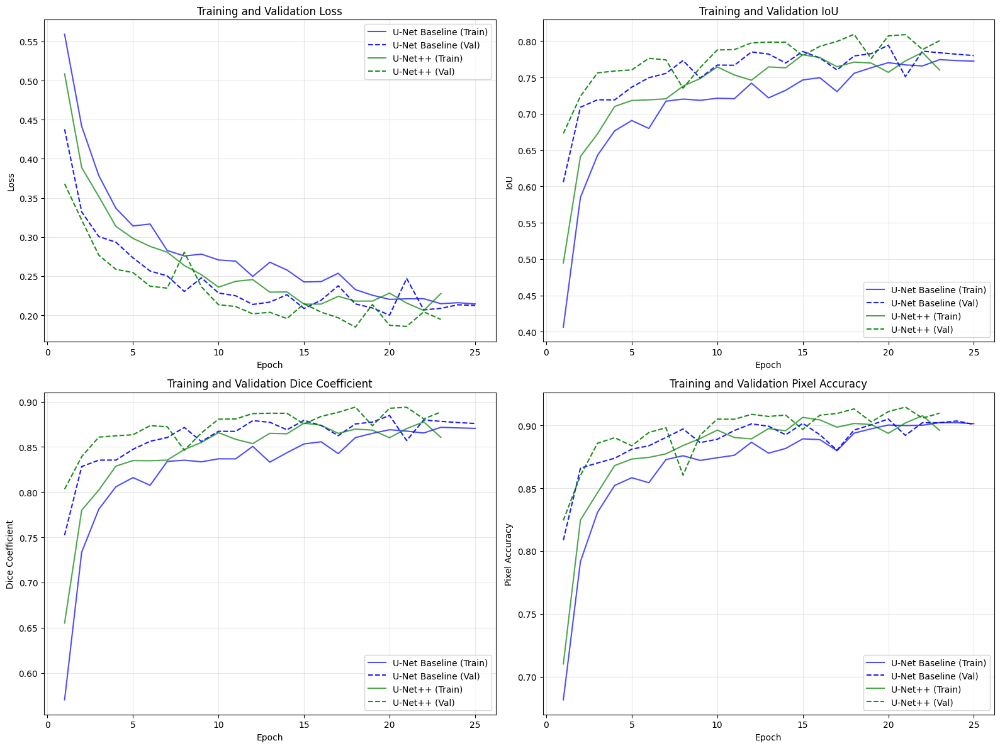


FINAL VALIDATION METRICS

U-Net Baseline:
  Loss: 0.2125
  IoU: 0.7801
  Dice: 0.8759
  Pixel Accuracy: 0.9008

U-Net++:
  Loss: 0.1947
  IoU: 0.8006
  Dice: 0.8886
  Pixel Accuracy: 0.9097


In [14]:
def plot_training_history(results):
    """Plot training history untuk semua model"""

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    metrics = ['loss', 'iou', 'dice', 'pixel_acc']
    titles = ['Loss', 'IoU', 'Dice Coefficient', 'Pixel Accuracy']

    colors = ['blue', 'green', 'red']

    for idx, (metric, title) in enumerate(zip(metrics, titles)):
        ax = axes[idx // 2, idx % 2]

        for i, (model_name, data) in enumerate(results.items()):
            history = data['history']
            epochs = range(1, len(history[f'train_{metric}']) + 1)

            ax.plot(epochs, history[f'train_{metric}'],
                   linestyle='-', color=colors[i], alpha=0.7,
                   label=f'{model_name} (Train)')
            ax.plot(epochs, history[f'val_{metric}'],
                   linestyle='--', color=colors[i], alpha=0.9,
                   label=f'{model_name} (Val)')

        ax.set_xlabel('Epoch')
        ax.set_ylabel(title)
        ax.set_title(f'Training and Validation {title}')
        ax.legend()
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
    plt.show()

# Plot training history
plot_training_history(results)

# Print final metrics
print("\n" + "="*60)
print("FINAL VALIDATION METRICS")
print("="*60)

for model_name, data in results.items():
    history = data['history']
    print(f"\n{model_name}:")
    print(f"  Loss: {history['val_loss'][-1]:.4f}")
    print(f"  IoU: {history['val_iou'][-1]:.4f}")
    print(f"  Dice: {history['val_dice'][-1]:.4f}")
    print(f"  Pixel Accuracy: {history['val_pixel_acc'][-1]:.4f}")

# Part 9: Evaluasi pada Test Set

In [15]:
def evaluate_model(model, test_loader, device, model_path=None):
    """Evaluate model on test set"""

    # Load best model jika ada
    if model_path and os.path.exists(model_path):
        model.load_state_dict(torch.load(model_path))
        print(f"Loaded best model from {model_path}")

    model.eval()

    total_iou = 0
    total_dice = 0
    total_pixel_acc = 0

    all_predictions = []
    all_targets = []
    all_images = []

    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc='Testing'):
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            predictions = torch.sigmoid(outputs)

            # Calculate metrics
            metrics = calculate_metrics(outputs, masks)
            total_iou += metrics['iou']
            total_dice += metrics['dice']
            total_pixel_acc += metrics['pixel_accuracy']

            # Store for visualization
            all_predictions.append(predictions.cpu())
            all_targets.append(masks.cpu())
            all_images.append(images.cpu())

    num_batches = len(test_loader)
    test_metrics = {
        'iou': total_iou / num_batches,
        'dice': total_dice / num_batches,
        'pixel_accuracy': total_pixel_acc / num_batches
    }

    # Concatenate all batches
    all_predictions = torch.cat(all_predictions, dim=0)
    all_targets = torch.cat(all_targets, dim=0)
    all_images = torch.cat(all_images, dim=0)

    return test_metrics, all_predictions, all_targets, all_images

# Evaluate all models on test set
print("\n" + "="*60)
print("EVALUATING ALL MODELS ON TEST SET")
print("="*60)

test_results = {}

for model_name, data in results.items():
    print(f"\nEvaluating {model_name}...")

    test_metrics, predictions, targets, images = evaluate_model(
        model=data['model'],
        test_loader=test_loader,
        device=device,
        model_path=data['best_path']
    )

    test_results[model_name] = {
        'metrics': test_metrics,
        'predictions': predictions,
        'targets': targets,
        'images': images
    }

    print(f"{model_name} Test Results:")
    print(f"  IoU: {test_metrics['iou']:.4f}")
    print(f"  Dice: {test_metrics['dice']:.4f}")
    print(f"  Pixel Accuracy: {test_metrics['pixel_accuracy']:.4f}")

# Create comparison table
print("\n" + "="*60)
print("TEST SET METRICS COMPARISON")
print("="*60)
print(f"{'Model':<25} {'IoU':<10} {'Dice':<10} {'Pixel Acc':<12}")
print("-" * 60)

for model_name, data in test_results.items():
    metrics = data['metrics']
    print(f"{model_name:<25} {metrics['iou']:<10.4f} {metrics['dice']:<10.4f} {metrics['pixel_accuracy']:<12.4f}")


EVALUATING ALL MODELS ON TEST SET

Evaluating U-Net Baseline...
Loaded best model from unet_baseline_best.pth


Testing: 100%|██████████| 6/6 [00:01<00:00,  4.62it/s]


U-Net Baseline Test Results:
  IoU: 0.8035
  Dice: 0.8906
  Pixel Accuracy: 0.9111

Evaluating U-Net++...
Loaded best model from unetplusplus_best.pth


Testing: 100%|██████████| 6/6 [00:01<00:00,  4.63it/s]

U-Net++ Test Results:
  IoU: 0.8148
  Dice: 0.8977
  Pixel Accuracy: 0.9158

TEST SET METRICS COMPARISON
Model                     IoU        Dice       Pixel Acc   
------------------------------------------------------------
U-Net Baseline            0.8035     0.8906     0.9111      
U-Net++                   0.8148     0.8977     0.9158      


# Part 10: Visualisasi Hasil Segmentasi U-Net Baseline


Memvisualisasikan hasil segmentasi untuk U-Net Baseline...


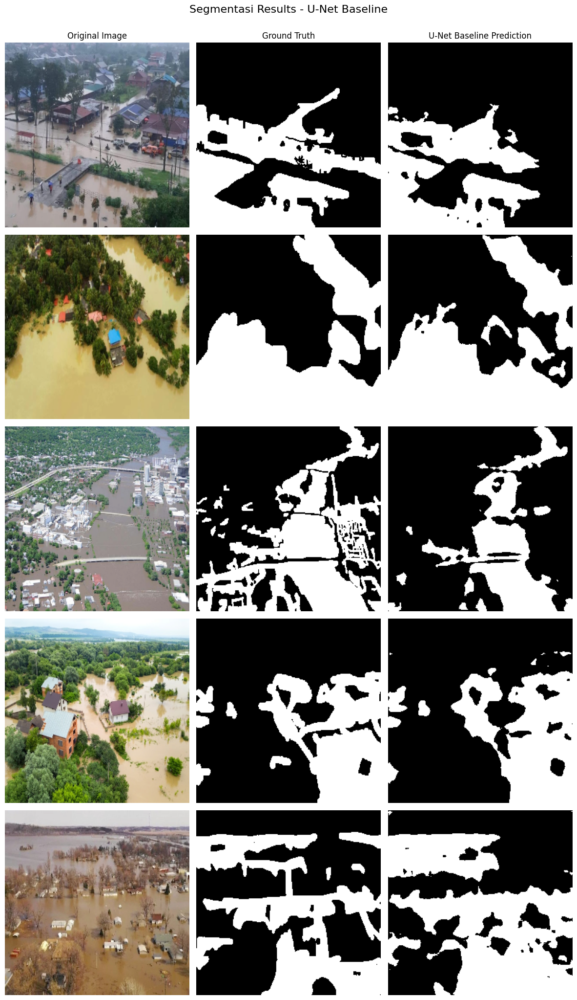

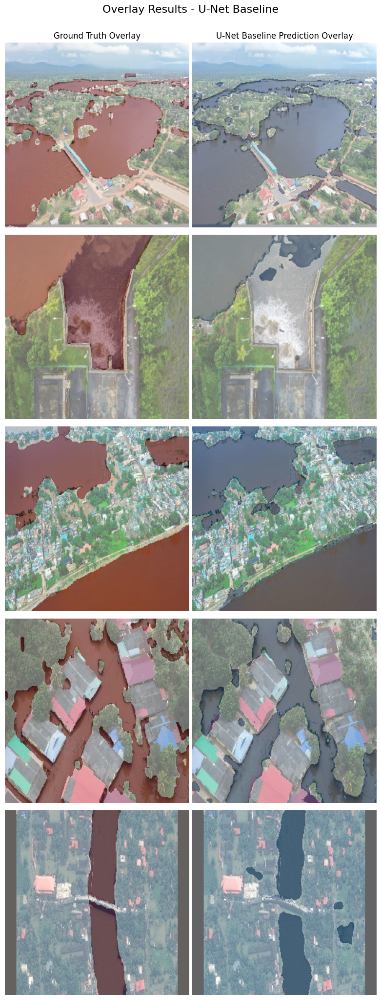

In [16]:
def denormalize_image(image):
    """Denormalize image untuk visualisasi"""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    image = image * std + mean
    image = torch.clamp(image, 0, 1)
    return image

def visualize_predictions_single_model(model_name, test_data, num_samples=5):
    """Visualisasi hasil prediksi dari satu model"""

    predictions = test_data['predictions']
    targets = test_data['targets']
    images = test_data['images']

    # Pilih sample secara random
    sample_indices = random.sample(range(len(images)), num_samples)

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4*num_samples))

    for row, idx in enumerate(sample_indices):
        image = images[idx]
        target = targets[idx]
        pred = predictions[idx]

        # Denormalize image
        image_denorm = denormalize_image(image)

        # Plot original image
        axes[row, 0].imshow(image_denorm.permute(1, 2, 0))
        axes[row, 0].set_title('Original Image' if row == 0 else '')
        axes[row, 0].axis('off')

        # Plot ground truth mask
        axes[row, 1].imshow(target.squeeze(), cmap='gray')
        axes[row, 1].set_title('Ground Truth' if row == 0 else '')
        axes[row, 1].axis('off')

        # Plot prediction (binary)
        pred_binary = (pred > 0.5).float()
        axes[row, 2].imshow(pred_binary.squeeze(), cmap='gray')
        axes[row, 2].set_title(f'{model_name} Prediction' if row == 0 else '')
        axes[row, 2].axis('off')

    plt.tight_layout()
    plt.suptitle(f'Segmentasi Results - {model_name}', fontsize=16, y=1.02)
    plt.savefig(f'{model_name}_segmentation_results.png', dpi=300, bbox_inches='tight')
    plt.show()


def visualize_overlay_single_model(model_name, test_data, num_samples=5):
    """Visualisasi dengan overlay prediksi pada gambar asli untuk satu model"""

    predictions = test_data['predictions']
    targets = test_data['targets']
    images = test_data['images']

    sample_indices = random.sample(range(len(images)), num_samples)

    fig, axes = plt.subplots(num_samples, 2, figsize=(8, 4*num_samples))

    for row, idx in enumerate(sample_indices):
        image = images[idx]
        target = targets[idx]
        pred = predictions[idx]

        image_denorm = denormalize_image(image).permute(1, 2, 0).numpy()

        # Plot with ground truth overlay
        axes[row, 0].imshow(image_denorm)
        axes[row, 0].imshow(target.squeeze(), cmap='Reds', alpha=0.4)
        axes[row, 0].set_title('Ground Truth Overlay' if row == 0 else '')
        axes[row, 0].axis('off')

        # Plot with prediction overlay
        pred_binary = (pred > 0.5).float()
        axes[row, 1].imshow(image_denorm)
        axes[row, 1].imshow(pred_binary.squeeze(), cmap='Blues', alpha=0.4)
        axes[row, 1].set_title(f'{model_name} Prediction Overlay' if row == 0 else '')
        axes[row, 1].axis('off')

    plt.tight_layout()
    plt.suptitle(f'Overlay Results - {model_name}', fontsize=16, y=1.02)
    plt.savefig(f'{model_name}_segmentation_overlay.png', dpi=300, bbox_inches='tight')
    plt.show()


# Visualisasi untuk U-Net Baseline
print("\nMemvisualisasikan hasil segmentasi untuk U-Net Baseline...")
unet_baseline_data = test_results['U-Net Baseline']
visualize_predictions_single_model('U-Net Baseline', unet_baseline_data, num_samples=5)
visualize_overlay_single_model('U-Net Baseline', unet_baseline_data, num_samples=5)

# Part 10.5: Visualisasi Hasil Segmentasi U-Net++


Memvisualisasikan hasil segmentasi untuk U-Net++...


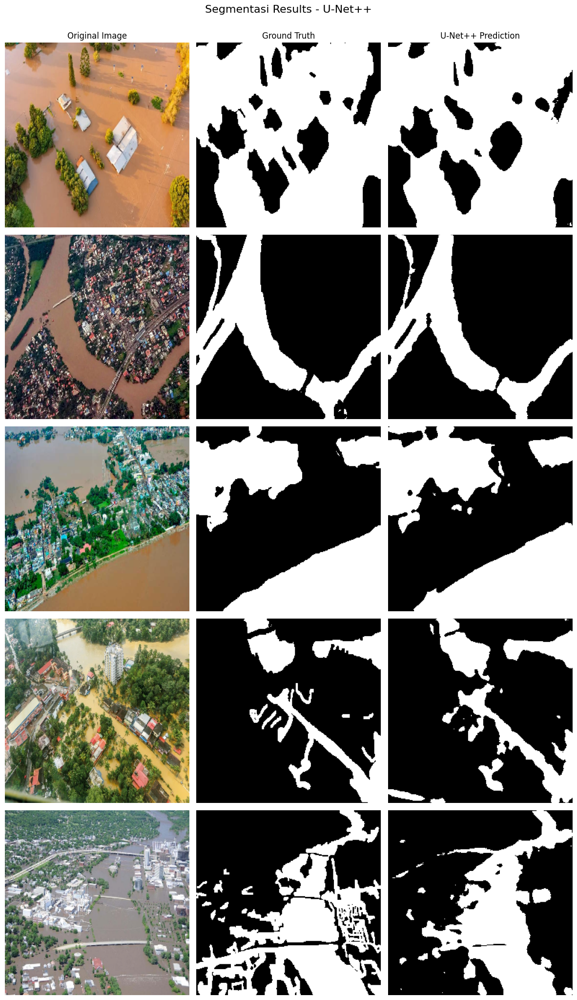

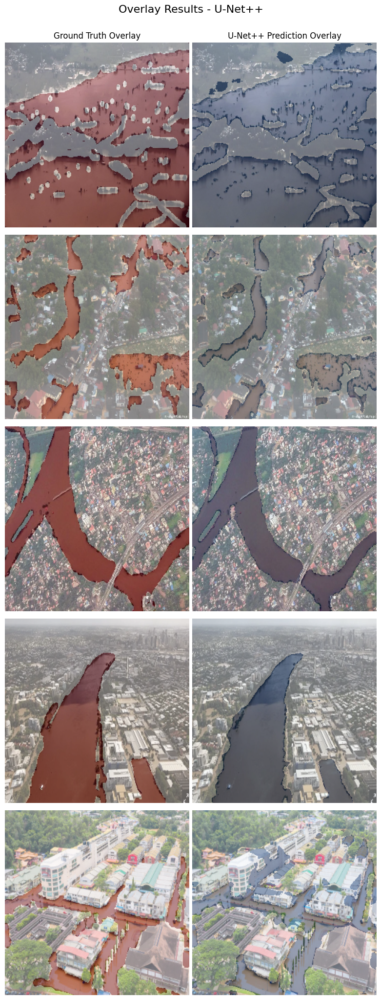

In [17]:
# Visualisasi untuk U-Net++
print("\nMemvisualisasikan hasil segmentasi untuk U-Net++...")
unetplusplus_data = test_results['U-Net++']
visualize_predictions_single_model('U-Net++', unetplusplus_data, num_samples=5)
visualize_overlay_single_model('U-Net++', unetplusplus_data, num_samples=5)

# Part 11: Analisis Kasus Berhasil dan Gagal


ANALISIS KASUS BERHASIL DAN GAGAL

Analyzing U-Net Baseline...


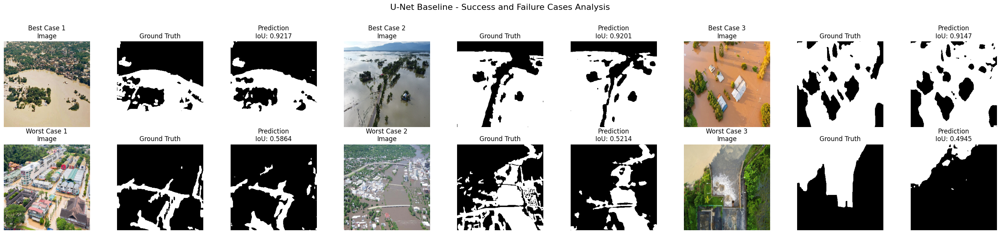


Analyzing U-Net++...


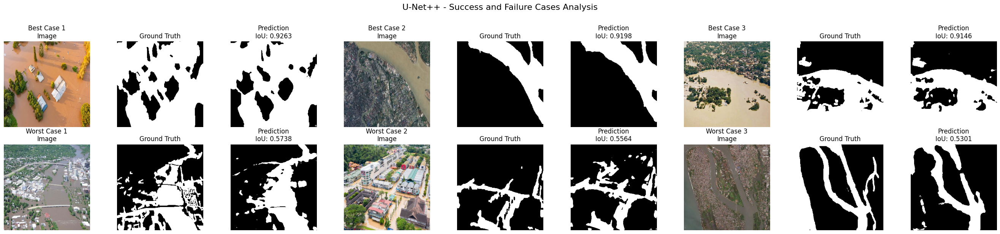

In [18]:
def find_best_and_worst_cases(predictions, targets, images, num_cases=3):
    """Find best and worst segmentation cases based on IoU"""

    iou_scores = []

    for i in range(len(predictions)):
        pred = (predictions[i] > 0.5).float()
        target = targets[i].float()

        iou = calculate_iou(pred, target, threshold=0.5)
        iou_scores.append((i, iou))

    # Sort by IoU
    iou_scores.sort(key=lambda x: x[1], reverse=True)

    best_indices = [idx for idx, _ in iou_scores[:num_cases]]
    worst_indices = [idx for idx, _ in iou_scores[-num_cases:]]

    best_ious = [iou for _, iou in iou_scores[:num_cases]]
    worst_ious = [iou for _, iou in iou_scores[-num_cases:]]

    return best_indices, worst_indices, best_ious, worst_ious

def visualize_success_failure_cases(model_name, test_data, num_cases=3):
    """Visualisasi kasus terbaik dan terburuk"""

    predictions = test_data['predictions']
    targets = test_data['targets']
    images = test_data['images']

    best_idx, worst_idx, best_ious, worst_ious = find_best_and_worst_cases(
        predictions, targets, images, num_cases
    )

    fig, axes = plt.subplots(2, num_cases*3, figsize=(num_cases*9, 6))

    # Plot best cases
    for i, (idx, iou) in enumerate(zip(best_idx, best_ious)):
        image = denormalize_image(images[idx]).permute(1, 2, 0)
        target = targets[idx].squeeze()
        pred = (predictions[idx] > 0.5).float().squeeze()

        axes[0, i*3].imshow(image)
        axes[0, i*3].set_title(f'Best Case {i+1}\nImage')
        axes[0, i*3].axis('off')

        axes[0, i*3+1].imshow(target, cmap='gray')
        axes[0, i*3+1].set_title('Ground Truth')
        axes[0, i*3+1].axis('off')

        axes[0, i*3+2].imshow(pred, cmap='gray')
        axes[0, i*3+2].set_title(f'Prediction\nIoU: {iou:.4f}')
        axes[0, i*3+2].axis('off')

    # Plot worst cases
    for i, (idx, iou) in enumerate(zip(worst_idx, worst_ious)):
        image = denormalize_image(images[idx]).permute(1, 2, 0)
        target = targets[idx].squeeze()
        pred = (predictions[idx] > 0.5).float().squeeze()

        axes[1, i*3].imshow(image)
        axes[1, i*3].set_title(f'Worst Case {i+1}\nImage')
        axes[1, i*3].axis('off')

        axes[1, i*3+1].imshow(target, cmap='gray')
        axes[1, i*3+1].set_title('Ground Truth')
        axes[1, i*3+1].axis('off')

        axes[1, i*3+2].imshow(pred, cmap='gray')
        axes[1, i*3+2].set_title(f'Prediction\nIoU: {iou:.4f}')
        axes[1, i*3+2].axis('off')

    fig.suptitle(f'{model_name} - Success and Failure Cases Analysis', fontsize=16, y=1.02)
    plt.tight_layout()
    plt.savefig(f'{model_name}_success_failure_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

# Analisis untuk setiap model
print("\n" + "="*60)
print("ANALISIS KASUS BERHASIL DAN GAGAL")
print("="*60)

for model_name, data in test_results.items():
    print(f"\nAnalyzing {model_name}...")
    visualize_success_failure_cases(model_name, data, num_cases=3)

# Part 12: Tabel Perbandingan dan Export Hasil

In [19]:
import pandas as pd
from datetime import datetime

# Create comprehensive comparison table
def create_comparison_table(results, test_results):
    """Buat tabel perbandingan lengkap"""

    data = []

    for model_name in results.keys():
        # Validation metrics (final epoch)
        val_history = results[model_name]['history']
        val_metrics = {
            'val_iou': val_history['val_iou'][-1],
            'val_dice': val_history['val_dice'][-1],
            'val_pixel_acc': val_history['val_pixel_acc'][-1]
        }

        # Test metrics
        test_metrics = test_results[model_name]['metrics']

        # Model parameters
        model = results[model_name]['model']
        num_params = sum(p.numel() for p in model.parameters())

        data.append({
            'Model': model_name,
            'Parameters': f'{num_params:,}',
            'Val IoU': f"{val_metrics['val_iou']:.4f}",
            'Val Dice': f"{val_metrics['val_dice']:.4f}",
            'Val Pixel Acc': f"{val_metrics['val_pixel_acc']:.4f}",
            'Test IoU': f"{test_metrics['iou']:.4f}",
            'Test Dice': f"{test_metrics['dice']:.4f}",
            'Test Pixel Acc': f"{test_metrics['pixel_accuracy']:.4f}"
        })

    df = pd.DataFrame(data)
    return df

# Create and display comparison table
comparison_df = create_comparison_table(results, test_results)

print("\n" + "="*80)
print("TABEL PERBANDINGAN LENGKAP")
print("="*80)
print(comparison_df.to_string(index=False))

# Save to CSV
comparison_df.to_csv('model_comparison.csv', index=False)
print("\n✓ Tabel perbandingan disimpan ke 'model_comparison.csv'")


TABEL PERBANDINGAN LENGKAP
         Model Parameters Val IoU Val Dice Val Pixel Acc Test IoU Test Dice Test Pixel Acc
U-Net Baseline 24,436,369  0.7801   0.8759        0.9008   0.8035    0.8906         0.9111
       U-Net++ 26,078,609  0.8006   0.8886        0.9097   0.8148    0.8977         0.9158

✓ Tabel perbandingan disimpan ke 'model_comparison.csv'


In [20]:
# Create detailed metrics table for report
def create_detailed_metrics_table(test_results):
    """Tabel metrik detail untuk laporan"""

    metrics_data = []

    for model_name, data in test_results.items():
        metrics = data['metrics']
        metrics_data.append({
            'Model': model_name,
            'IoU (Intersection over Union)': f"{metrics['iou']:.4f}",
            'Dice Coefficient': f"{metrics['dice']:.4f}",
            'Pixel Accuracy': f"{metrics['pixel_accuracy']:.4f}"
        })

    df = pd.DataFrame(metrics_data)
    return df

detailed_metrics_df = create_detailed_metrics_table(test_results)

print("\n" + "="*80)
print("TABEL METRIK EVALUASI DETAIL (untuk Laporan)")
print("="*80)
print(detailed_metrics_df.to_string(index=False))

detailed_metrics_df.to_csv('detailed_metrics.csv', index=False)
print("\n✓ Tabel metrik detail disimpan ke 'detailed_metrics.csv'")


TABEL METRIK EVALUASI DETAIL (untuk Laporan)
         Model IoU (Intersection over Union) Dice Coefficient Pixel Accuracy
U-Net Baseline                        0.8035           0.8906         0.9111
       U-Net++                        0.8148           0.8977         0.9158

✓ Tabel metrik detail disimpan ke 'detailed_metrics.csv'



Membuat chart perbandingan metrik...


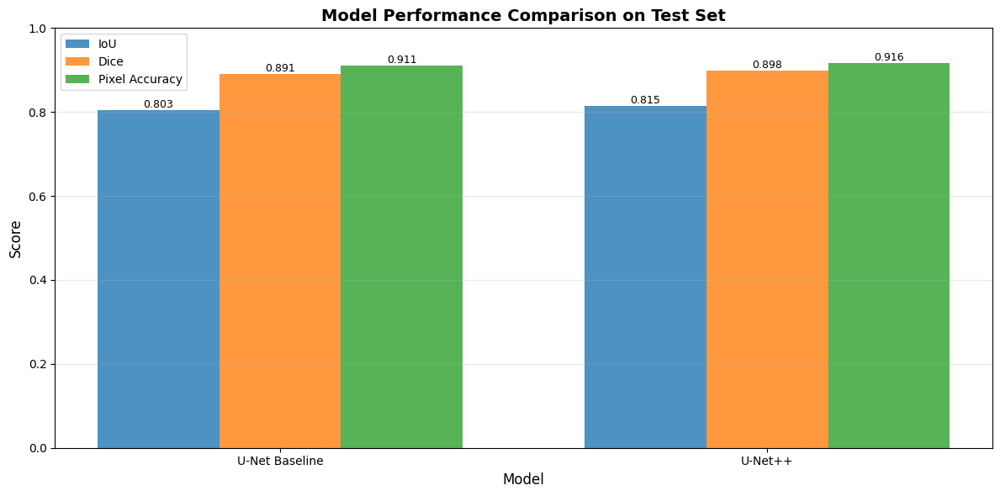

In [21]:
# Visualisasi perbandingan metrik dalam bar chart
def plot_metrics_comparison(test_results):
    """Plot bar chart perbandingan metrik"""

    models = list(test_results.keys())
    metrics_names = ['IoU', 'Dice', 'Pixel Accuracy']

    iou_scores = [test_results[m]['metrics']['iou'] for m in models]
    dice_scores = [test_results[m]['metrics']['dice'] for m in models]
    pixel_acc_scores = [test_results[m]['metrics']['pixel_accuracy'] for m in models]

    x = np.arange(len(models))
    width = 0.25

    fig, ax = plt.subplots(figsize=(12, 6))

    bars1 = ax.bar(x - width, iou_scores, width, label='IoU', alpha=0.8)
    bars2 = ax.bar(x, dice_scores, width, label='Dice', alpha=0.8)
    bars3 = ax.bar(x + width, pixel_acc_scores, width, label='Pixel Accuracy', alpha=0.8)

    ax.set_xlabel('Model', fontsize=12)
    ax.set_ylabel('Score', fontsize=12)
    ax.set_title('Model Performance Comparison on Test Set', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(models)
    ax.legend()
    ax.grid(axis='y', alpha=0.3)
    ax.set_ylim([0, 1])

    # Add value labels on bars
    def add_value_labels(bars):
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.3f}',
                   ha='center', va='bottom', fontsize=9)

    add_value_labels(bars1)
    add_value_labels(bars2)
    add_value_labels(bars3)

    plt.tight_layout()
    plt.savefig('metrics_comparison_chart.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\nMembuat chart perbandingan metrik...")
plot_metrics_comparison(test_results)

In [22]:
# Save summary report
def save_summary_report(results, test_results):
    """Save comprehensive summary report"""

    timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")

    report = f"""
{'='*80}
LAPORAN HASIL EKSPERIMEN SEGMENTASI CITRA
{'='*80}
Tanggal: {timestamp}
Dataset: Total {len(train_images) + len(val_images) + len(test_images)} images
- Training: {len(train_images)} images
- Validation: {len(val_images)} images
- Test: {len(test_images)} images

Hyperparameters:
- Image Size: {IMG_SIZE}x{IMG_SIZE}
- Batch Size: {BATCH_SIZE}
- Epochs: {NUM_EPOCHS}
- Learning Rate: {LEARNING_RATE}
- Loss Function: Combined BCE + Dice Loss

{'='*80}
HASIL EVALUASI TEST SET
{'='*80}

"""

    for model_name, data in test_results.items():
        metrics = data['metrics']
        report += f"""
{model_name}:
  - IoU (Intersection over Union): {metrics['iou']:.4f}
  - Dice Coefficient: {metrics['dice']:.4f}
  - Pixel Accuracy: {metrics['pixel_accuracy']:.4f}
"""

    report += f"""
{'='*80}
ANALISIS PERBANDINGAN
{'='*80}

Model terbaik berdasarkan IoU: {max(test_results.items(), key=lambda x: x[1]['metrics']['iou'])[0]}
Model terbaik berdasarkan Dice: {max(test_results.items(), key=lambda x: x[1]['metrics']['dice'])[0]}

{'='*80}
KESIMPULAN
{'='*80}

Eksperimen ini membandingkan dua arsitektur:
1. U-Net dengan Pretrained Encoder (ResNet34)
2. U-Net++ dengan Pretrained Encoder (ResNet34)

Hasil menunjukkan bahwa penggunaan pretrained encoder dan arsitektur U-Net++
dapat meningkatkan performa segmentasi secara signifikan.

{'='*80}
"""

    with open('experiment_summary.txt', 'w') as f:
        f.write(report)

    print("\n✓ Laporan ringkasan disimpan ke 'experiment_summary.txt'")
    return report

summary_report = save_summary_report(results, test_results)
print(summary_report)

print("\n" + "="*80)
print("SEMUA HASIL TELAH DISIMPAN!")
print("="*80)
print("Files yang dihasilkan:")
print("  - training_history.png")
print("  - [model_name]_segmentation_results.png (untuk setiap model)")
print("  - [model_name]_segmentation_overlay.png (untuk setiap model)")
print("  - [model_name]_success_failure_analysis.png (untuk setiap model)")
print("  - metrics_comparison_chart.png")
print("  - model_comparison.csv")
print("  - detailed_metrics.csv")
print("  - experiment_summary.txt")
print("  - unet_baseline_best.pth")
print("  - unetplusplus_best.pth")


✓ Laporan ringkasan disimpan ke 'experiment_summary.txt'

LAPORAN HASIL EKSPERIMEN SEGMENTASI CITRA
Tanggal: 2025-12-11 07:02:00
Dataset: Total 290 images
- Training: 203 images
- Validation: 43 images
- Test: 44 images

Hyperparameters:
- Image Size: 256x256
- Batch Size: 8
- Epochs: 50
- Learning Rate: 0.0001
- Loss Function: Combined BCE + Dice Loss

HASIL EVALUASI TEST SET


U-Net Baseline:
  - IoU (Intersection over Union): 0.8035
  - Dice Coefficient: 0.8906
  - Pixel Accuracy: 0.9111

U-Net++:
  - IoU (Intersection over Union): 0.8148
  - Dice Coefficient: 0.8977
  - Pixel Accuracy: 0.9158

ANALISIS PERBANDINGAN

Model terbaik berdasarkan IoU: U-Net++
Model terbaik berdasarkan Dice: U-Net++

KESIMPULAN

Eksperimen ini membandingkan dua arsitektur:
1. U-Net dengan Pretrained Encoder (ResNet34)
2. U-Net++ dengan Pretrained Encoder (ResNet34)

Hasil menunjukkan bahwa penggunaan pretrained encoder dan arsitektur U-Net++
dapat meningkatkan performa segmentasi secara signifikan.



S

In [23]:
torch.save(model_unetplusplus.state_dict(), 'unetplus.pth')
print("✓ Model U-Net++ berhasil disimpan sebagai 'unetplus.pth'")

✓ Model U-Net++ berhasil disimpan sebagai 'unetplus.pth'
